<a href="https://colab.research.google.com/github/santosh0072/CSCE5218_DEEPLEARNING/blob/main/Deep_Fashion_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle

from google.colab import files
files.upload()  # Choose the Kaggle API key file you downloaded

!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d hserdaraltan/deepfashion-inshop-clothes-retrieval
!unzip -q deepfashion-inshop-clothes-retrieval.zip -d deepfashion


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Saving kaggle.json to kaggle.json
100% 7.84G/7.84G [04:39<00:00, 32.4MB/s]
100% 7.84G/7.84G [04:39<00:00, 30.1MB/s]


In [ ]:
import os
import numpy as np
import math
import sys
from time import time
from torchvision import transforms
from torchvision.utils import save_image
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch
import torchvision
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Define hyperparameters
class Opt(object):
    n_epochs = 200
    batch_size = 128
    lr = 0.0002
    b1 = 0.5
    b2 = 0.999
    n_cpu = 8
    latent_dim = 100
    img_size = 64
    channels = 3
    sample_interval = 400

opt = Opt()

cuda = True if torch.cuda.is_available() else False

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.init_size = opt.img_size // 4
        self.l1 = nn.Sequential(nn.Linear(opt.latent_dim, 128*self.init_size**2))

        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, opt.channels, 3, stride=1, padding=1),
            nn.Tanh(),
        )

    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img
        

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, bn=True):
            block = [   nn.Conv2d(in_filters, out_filters, 3, 2, 1),
                        nn.LeakyReLU(0.2, inplace=True),
                        nn.Dropout2d(0.25)]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            return block

        self.model = nn.Sequential(
            *discriminator_block(opt.channels, 16, bn=False),
            *discriminator_block(16, 32),
            *discriminator_block(32, 64),
            *discriminator_block(64, 128),
        )

        # The height and width of downsampled image
        ds_size = opt.img_size // 2**4
        self.adv_layer = nn.Sequential( nn.Linear(128*ds_size**2, 1),
                                         nn.Sigmoid())

    def forward(self, img):
        out = self.model(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)
        return validity
        

In [ ]:
# Define the transform to be applied to each image
transform = transforms.Compose([
    transforms.Resize(opt.img_size),
    transforms.CenterCrop(opt.img_size),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

# Load the dataset from the 'img_highres' folder
train_dataset = ImageFolder('deepfashion/img_highres', transform=transform)

# Create the dataloader
dataloader = DataLoader(train_dataset, batch_size=opt.batch_size, shuffle=True)

# Initialize the generator and discriminator models
generator = Generator()
discriminator = Discriminator()

# Use binary cross-entropy loss and Adam optimizer for both models
adversarial_loss = nn.BCELoss()
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()

os.makedirs("images", exist_ok=True)

# Initialize lists to store the losses
G_losses = []
D_losses = []

# Training loop
for epoch in range(opt.n_epochs):
    for i, (imgs, _) in enumerate(dataloader):
        
        # Adversarial ground truths
        valid = Variable(torch.Tensor(imgs.size(0), 1).fill_(1.0), requires_grad=False)
        fake = Variable(torch.Tensor(imgs.size(0), 1).fill_(0.0), requires_grad=False)
        
        if cuda:
            imgs = imgs.cuda()
            valid = valid.cuda()
            fake = fake.cuda()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        discriminator.zero_grad()

        # Real images
        real_pred = discriminator(imgs)
        d_real_loss = adversarial_loss(real_pred, valid)

        # Fake images
        z = Variable(torch.randn(imgs.size(0), opt.latent_dim))
        if cuda:
            z = z.cuda()

        fake_imgs = generator(z) 
        fake_pred = discriminator(fake_imgs.detach())
        d_fake_loss = adversarial_loss(fake_pred, fake)

        # Total discriminator loss
        d_loss = (d_real_loss + d_fake_loss) / 2

        d_loss.backward()
        optimizer_D.step()

        # -----------------
        #  Train Generator
        # -----------------

        generator.zero_grad()

        z = Variable(torch.randn(imgs.size(0), opt.latent_dim))
        if cuda:
            z = z.cuda()

        fake_imgs = generator(z)
        fake_pred = discriminator(fake_imgs)

        g_loss = adversarial_loss(fake_pred, valid)

        g_loss.backward()
        optimizer_G.step()

        # Print training progress
        batches_done = epoch * len(dataloader) + i
        if batches_done % opt.sample_interval == 0:
            print("[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]" % (epoch, opt.n_epochs, i, len(dataloader), d_loss.item(), g_loss.item()))
            G_losses.append(g_loss.item())
            D_losses.append(d_loss.item())

            # Save a sample of generated images
            save_image(fake_imgs.data[:25], "images/%d.png" % batches_done, nrow=5, normalize=True)


[Epoch 0/200] [Batch 0/520] [D loss: 0.572049] [G loss: 0.639924]
[Epoch 0/200] [Batch 400/520] [D loss: 0.548173] [G loss: 0.663890]
[Epoch 1/200] [Batch 0/520] [D loss: 0.584987] [G loss: 0.677829]
[Epoch 1/200] [Batch 400/520] [D loss: 0.572075] [G loss: 0.607119]
[Epoch 2/200] [Batch 0/520] [D loss: 0.615951] [G loss: 0.613336]
[Epoch 2/200] [Batch 400/520] [D loss: 0.523908] [G loss: 0.674414]
[Epoch 3/200] [Batch 0/520] [D loss: 0.649716] [G loss: 0.694226]
[Epoch 3/200] [Batch 400/520] [D loss: 0.624772] [G loss: 0.605044]
[Epoch 4/200] [Batch 0/520] [D loss: 0.669002] [G loss: 0.658732]
[Epoch 4/200] [Batch 400/520] [D loss: 0.638723] [G loss: 0.695020]
[Epoch 5/200] [Batch 0/520] [D loss: 0.505071] [G loss: 0.628535]
[Epoch 5/200] [Batch 400/520] [D loss: 0.638212] [G loss: 0.612764]
[Epoch 6/200] [Batch 0/520] [D loss: 0.603166] [G loss: 0.694835]
[Epoch 6/200] [Batch 400/520] [D loss: 0.523025] [G loss: 0.651492]
[Epoch 7/200] [Batch 0/520] [D loss: 0.550652] [G loss: 0.6684

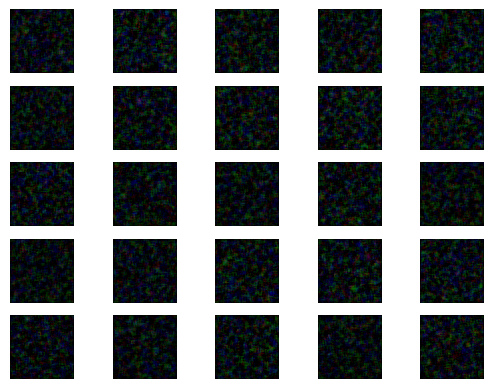

In [ ]:
# Generate 25 random images
z = Variable(torch.FloatTensor(np.random.normal(0, 1, (25, opt.latent_dim))))
if cuda:
    z = z.cuda()
fake_imgs = generator(z).detach().cpu()

# Visualize the generated images
fig, axs = plt.subplots(5, 5)
cnt = 0
for i in range(5):
    for j in range(5):
        axs[i,j].imshow(np.transpose(fake_imgs[cnt], (1,2,0)))
        axs[i,j].axis('off')
        cnt += 1
plt.show()


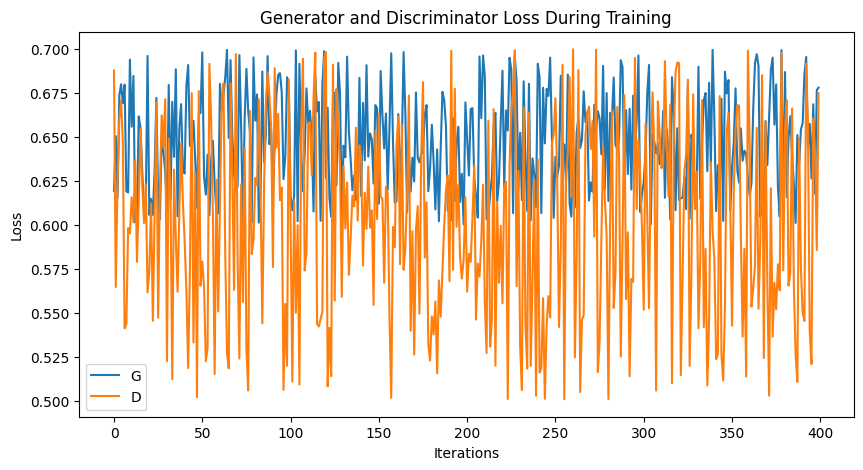

In [ ]:
# Plot the generator and discriminator loss curves
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

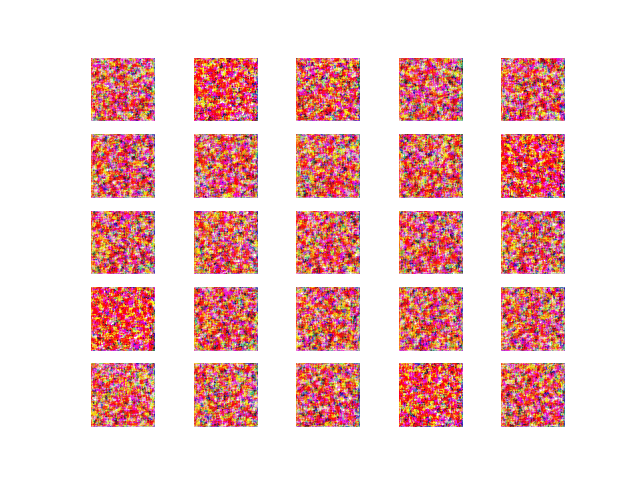

In [ ]:
import os
import imageio

# Path to the folder containing the images
folder_path = 'images/'

# Get the list of image files in the folder
images = sorted([os.path.join(folder_path, file_name) for file_name in os.listdir(folder_path) if file_name.endswith('.png')])

# Create the gif
with imageio.get_writer('DeepFashionGAN.gif', mode='I') as writer:
    for image in images:
        img = imageio.imread(image)
        writer.append_data(img)

# Display GAN
from IPython.display import Image
with open('DeepFashionGAN.gif','rb') as f:
    display(Image(data=f.read(), format='gif'))